In [1]:
#region Basic_Import
## Basic
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
os.path.dirname(os.path.abspath('__file__'))
import sys
sys.path.append(os.path.dirname(os.path.abspath(os.path.dirname('__file__'))))

import warnings
warnings.filterwarnings('ignore')

import numpy as np, pandas as pd
from pandas import DataFrame, Series

import math, random

## Datetime
import time
import datetime as dt
from datetime import datetime, date, timedelta

import glob
from glob import glob
import requests
import json

## 시각화
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = [10, 8]

from scipy import stats

# K-Means 알고리즘
from sklearn.cluster import KMeans, MiniBatchKMeans

# CLustering 알고리즘의 성능 평가 측도
from sklearn.metrics import homogeneity_score, completeness_score, v_measure_score, adjusted_rand_score, silhouette_score, rand_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.metrics.cluster import contingency_matrix

## 정규화
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn import metrics

import urllib
from urllib.request import urlopen
from urllib.parse import urlencode, unquote, quote_plus

from selenium import webdriver
from selenium.webdriver.chrome.service import Service

from webdriver_manager.chrome import ChromeDriverManager
from bs4 import BeautifulSoup

from tqdm.notebook import tqdm
import tqdm

## Init.
pd.options.display.float_format = '{:.10f}'.format
#endregion Basic_Import

In [2]:
## Import_DL
str_tar = "tf"
## For Torch
if str_tar == "torch":
    import torch
    import torch.nn as nn
    from torch.nn.utils import weight_norm
    print("Torch Imported")
## For TF
elif str_tar == "tf":
    import tensorflow as tf
    import tensorflow_addons as tfa
    from keras.callbacks import EarlyStopping, ModelCheckpoint
    from keras.models import Sequential, load_model
    from keras_flops import get_flops
    print("Tensorflow Imported")
else:
    print("Error : Cannot be used except for Keywords")
    print(" : torch / tf")

Tensorflow Imported


In [3]:
## Import_Local
from Src_Dev_Common import Data_Datetime as com_date
# from Src_Dev_Common import DEV_KASI_Holiday as com_Holi
# from Src_Dev_Common import DEV_Common_Data_Analysis as com_Analysis
from Src_Dev_Common import Data_Preprocessing as com_Prep
from Src_Dev_Common import Common_Model as com_Model
# from Src_Dev_Common import DEV_Common_Data_Visualization as com_Visual
# from Src_Dev_Common import DEV_KMA_Weather_ASOS as com_ASOS
# from Src_Dev_Common import DEV_KDHC_Usage as com_KDHC
# from Src_Dev_Common import DEV_KIER_Usage as com_KIER

## Data Load

In [4]:
## Raw Data Load
df_KIER_5Domain = pd.read_csv('KIER_Merged_5domain_2024-07-08.csv', index_col = 0)

data = df_KIER_5Domain.drop(['METER_DATE', 'YEAR'], axis=1)
back_data = df_KIER_5Domain.drop(['YEAR'], axis=1)

print(df_KIER_5Domain.shape, '///', df_KIER_5Domain.columns)
df_KIER_5Domain

(16413, 29) /// Index(['METER_DATE', 'YEAR', 'MONTH', 'DAY', 'code_day_of_the_week', 'HOUR',
       'MINUTE', 'temp_outdoor', 'temp_dew_point', 'temp_ground', 'humidity',
       'rainfall', 'snowfall', 'snowfall_3hr', 'wind_speed', 'wind_direction',
       'pressure_vapor', 'pressure_area', 'pressure_sea', 'sunshine',
       'solar_radiation', 'cloud_total', 'cloud_midlow', 'visual_range',
       'ELEC_INST', 'HEAT_INST', 'WATER_INST', 'HOT_INST', 'GAS_INST'],
      dtype='object')


,METER_DATE,YEAR,MONTH,DAY,code_day_of_the_week,HOUR,MINUTE,temp_outdoor,temp_dew_point,temp_ground,...,sunshine,solar_radiation,cloud_total,cloud_midlow,visual_range,ELEC_INST,HEAT_INST,WATER_INST,HOT_INST,GAS_INST
0,2022-07-20 13:00:00,2022,7,20,2,13,0,29.8000000000,21.4000000000,41.5000000000,...,1.0000000000,2.8900000000,8.0000000000,2.0000000000,1903.0000000000,194.7787303232,0.0001975346,7.0350500000,0.0000093275,0.0000000000
1,2022-07-20 14:00:00,2022,7,20,2,14,0,30.4000000000,20.0000000000,42.4000000000,...,1.0000000000,2.8500000000,8.0000000000,1.0000000000,1986.0000000000,185.5468089258,0.0001975346,7.0453500000,0.0000031403,0.0003690685
2,2022-07-20 15:00:00,2022,7,20,2,15,0,30.5000000000,21.0000000000,41.9000000000,...,0.8000000000,2.3800000000,7.0000000000,2.0000000000,1985.0000000000,191.8368089258,0.0001975346,6.4400500000,0.0000034357,0.0102684149
3,2022-07-20 16:00:00,2022,7,20,2,16,0,30.8000000000,20.7000000000,39.7000000000,...,1.0000000000,2.1900000000,5.0000000000,3.0000000000,1993.0000000000,185.9038264696,0.0001975346,7.4170000000,0.0000072374,0.0218035922
4,2022-07-20 17:00:00,2022,7,20,2,17,0,29.5000000000,20.0000000000,34.5000000000,...,0.3000000000,1.0200000000,9.0000000000,1.0000000000,2000.0000000000,189.2517825136,0.0001975346,10.2510000000,0.0000123613,0.0218035922
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16408,2024-06-03 05:00:00,2024,6,3,0,5,0,13.1000000000,10.8000000000,14.7000000000,...,0.0000000000,0.0000000000,0.0000000000,0.0000000000,2976.0000000000,80.6379999998,0.0000000000,6.0601202899,0.0000305033,0.0000000000
16409,2024-06-03 06:00:00,2024,6,3,0,6,0,13.7000000000,10.8000000000,15.0000000000,...,0.1000000000,0.0500000000,0.0000000000,0.0000000000,3874.0000000000,85.4079999998,0.0000000000,8.2929202899,0.0000944223,0.1200000000
16410,2024-06-03 07:00:00,2024,6,3,0,7,0,18.0000000000,11.9000000000,17.0000000000,...,1.0000000000,0.5600000000,0.0000000000,0.0000000000,5000.0000000000,111.6829999997,0.0000000000,11.7601202899,0.0002607810,0.3600000000
16411,2024-06-03 08:00:00,2024,6,3,0,8,0,19.7000000000,12.2000000000,22.5000000000,...,1.0000000000,1.2500000000,0.0000000000,0.0000000000,5000.0000000000,121.9929999998,0.0000000000,9.9387202899,0.0000540724,0.3800000000


##  For Scaling

In [5]:
scaler_data = MinMaxScaler()
scaler_data.fit(data)
scaled_data = scaler_data.transform(data)

new_data = pd.DataFrame(scaled_data, index=data.index, columns=data.columns)

## Input/Target 분리
multi0301_ELEC_HEAT_WATER_X = new_data.drop(['HOT_INST', 'GAS_INST'], axis=1).iloc[:-1,]
multi0301_ELEC_HEAT_WATER_Y = new_data[['ELEC_INST','HEAT_INST','WATER_INST']].iloc[1:,]

multi0302_ELEC_HEAT_HOT_X = new_data.drop(['WATER_INST', 'GAS_INST'], axis=1).iloc[:-1,]
multi0302_ELEC_HEAT_HOT_Y = new_data[['ELEC_INST','HEAT_INST','HOT_INST']].iloc[1:,]

multi0303_ELEC_HEAT_GAS_X = new_data.drop(['WATER_INST', 'HOT_INST'], axis=1).iloc[:-1,]
multi0303_ELEC_HEAT_GAS_Y = new_data[['ELEC_INST','HEAT_INST','GAS_INST']].iloc[1:,]

multi0304_ELEC_WATER_HOT_X = new_data.drop(['HEAT_INST', 'GAS_INST'], axis=1).iloc[:-1,]
multi0304_ELEC_WATER_HOT_Y = new_data[['ELEC_INST','WATER_INST','HOT_INST']].iloc[1:,]

multi0305_ELEC_WATER_GAS_X = new_data.drop(['HEAT_INST', 'HOT_INST'], axis=1).iloc[:-1,]
multi0305_ELEC_WATER_GAS_Y = new_data[['ELEC_INST','WATER_INST','GAS_INST']].iloc[1:,]

multi0306_ELEC_HOT_GAS_X = new_data.drop(['WATER_INST', 'HOT_INST'], axis=1).iloc[:-1,]
multi0306_ELEC_HOT_GAS_Y = new_data[['ELEC_INST','HOT_INST','GAS_INST']].iloc[1:,]

multi0307_HEAT_WATER_HOT_X = new_data.drop(['ELEC_INST', 'GAS_INST'], axis=1).iloc[:-1,]
multi0307_HEAT_WATER_HOT_Y = new_data[['HEAT_INST','WATER_INST','HOT_INST']].iloc[1:,]

multi0308_HEAT_WATER_GAS_X = new_data.drop(['ELEC_INST', 'HOT_INST'], axis=1).iloc[:-1,]
multi0308_HEAT_WATER_GAS_Y = new_data[['HEAT_INST','WATER_INST','GAS_INST']].iloc[1:,]

multi0309_HEAT_HOT_GAS_X = new_data.drop(['ELEC_INST', 'WATER_INST'], axis=1).iloc[:-1,]
multi0309_HEAT_HOT_GAS_Y = new_data[['HEAT_INST','HOT_INST','GAS_INST']].iloc[1:,]

multi0310_WATER_HOT_GAS_X = new_data.drop(['ELEC_INST', 'HEAT_INST'], axis=1).iloc[:-1,]
multi0310_WATER_HOT_GAS_Y = new_data[['WATER_INST','HOT_INST','GAS_INST']].iloc[1:,]

## Train/Test 분리
train0301X, test0301X, train0301Y, test0301Y = train_test_split(multi0301_ELEC_HEAT_WATER_X, multi0301_ELEC_HEAT_WATER_Y, test_size=0.3, shuffle=False, random_state=0)
train0302X, test0302X, train0302Y, test0302Y = train_test_split(multi0302_ELEC_HEAT_HOT_X, multi0302_ELEC_HEAT_HOT_Y, test_size=0.3, shuffle=False, random_state=0)
train0303X, test0303X, train0303Y, test0303Y = train_test_split(multi0303_ELEC_HEAT_GAS_X, multi0303_ELEC_HEAT_GAS_Y, test_size=0.3, shuffle=False, random_state=0)
train0304X, test0304X, train0304Y, test0304Y = train_test_split(multi0304_ELEC_WATER_HOT_X, multi0304_ELEC_WATER_HOT_Y, test_size=0.3, shuffle=False, random_state=0)
train0305X, test0305X, train0305Y, test0305Y = train_test_split(multi0305_ELEC_WATER_GAS_X, multi0305_ELEC_WATER_GAS_Y, test_size=0.3, shuffle=False, random_state=0)
train0306X, test0306X, train0306Y, test0306Y = train_test_split(multi0306_ELEC_HOT_GAS_X, multi0306_ELEC_HOT_GAS_Y, test_size=0.3, shuffle=False, random_state=0)
train0307X, test0307X, train0307Y, test0307Y = train_test_split(multi0307_HEAT_WATER_HOT_X, multi0307_HEAT_WATER_HOT_Y, test_size=0.3, shuffle=False, random_state=0)
train0308X, test0308X, train0308Y, test0308Y = train_test_split(multi0308_HEAT_WATER_GAS_X, multi0308_HEAT_WATER_GAS_Y, test_size=0.3, shuffle=False, random_state=0)
train0309X, test0309X, train0309Y, test0309Y = train_test_split(multi0309_HEAT_HOT_GAS_X, multi0309_HEAT_HOT_GAS_Y, test_size=0.3, shuffle=False, random_state=0)
train0310X, test0310X, train0310Y, test0310Y = train_test_split(multi0310_WATER_HOT_GAS_X, multi0310_WATER_HOT_GAS_Y, test_size=0.3, shuffle=False, random_state=0)

In [6]:
def buildDataSet(input, target, seqLength):
    xdata = []
    ydata = []
    for i in range(len(input) - seqLength):
        tx = input.iloc[i:i+seqLength]
        ty = target.iloc[i+seqLength-1]
        xdata.append(tx)
        ydata.append(ty)
    return np.array(xdata), np.array(ydata)

In [7]:
train0301x, train0301y = buildDataSet(train0301X, train0301Y, 24)
test0301x, test0301y = buildDataSet(test0301X, test0301Y, 24)

train0302x, train0302y = buildDataSet(train0302X, train0302Y, 24)
test0302x, test0302y = buildDataSet(test0302X, test0302Y, 24)

train0303x, train0303y = buildDataSet(train0303X, train0303Y, 24)
test0303x, test0303y = buildDataSet(test0303X, test0303Y, 24)

train0304x, train0304y = buildDataSet(train0304X, train0304Y, 24)
test0304x, test0304y = buildDataSet(test0304X, test0304Y, 24)

train0305x, train0305y = buildDataSet(train0305X, train0305Y, 24)
test0305x, test0305y = buildDataSet(test0305X, test0305Y, 24)

train0306x, train0306y = buildDataSet(train0306X, train0306Y, 24)
test0306x, test0306y = buildDataSet(test0306X, test0306Y, 24)

train0307x, train0307y = buildDataSet(train0307X, train0307Y, 24)
test0307x, test0307y = buildDataSet(test0307X, test0307Y, 24)

train0308x, train0308y = buildDataSet(train0308X, train0308Y, 24)
test0308x, test0308y = buildDataSet(test0308X, test0308Y, 24)

train0309x, train0309y = buildDataSet(train0309X, train0309Y, 24)
test0309x, test0309y = buildDataSet(test0309X, test0309Y, 24)

train0310x, train0310y = buildDataSet(train0310X, train0310Y, 24)
test0310x, test0310y = buildDataSet(test0310X, test0310Y, 24)

In [8]:
train0301x.shape

(11464, 24, 25)

In [9]:
def seq2seq_model(input_shape):
    model_input = tf.keras.layers.Input(shape=input_shape)

    # for feature extracting
    conv1 = tf.keras.layers.Conv1D(128, 1, activation='swish')(model_input)
    pool1 = tf.keras.layers.MaxPool1D(pool_size=2, strides=1, padding='same')(conv1)
    conv2 = tf.keras.layers.Conv1D(64, 1, activation='swish')(pool1)
    pool2 = tf.keras.layers.MaxPool1D(pool_size=2, strides=1, padding='same')(conv2)
    #conv3 = tf.keras.layers.Conv1D(32, 1, activation='swish')(pool2) #
    #pool3 = tf.keras.layers.MaxPool1D(pool_size=2, strides=1, padding='same')(conv3)#

    # 인코더 - 디코더 선언
    #encoder_lstm1 = tf.keras.layers.LSTM(32, return_sequences=True, activation='tanh') #
    encoder_lstm2 = tf.keras.layers.LSTM(64, return_sequences=True, activation='tanh')
    encoder_lstm3 = tf.keras.layers.LSTM(128, return_state=True, return_sequences=True, activation='tanh')

    decoder_lstm1 = tf.keras.layers.LSTM(128, return_sequences=True, activation='tanh')
    decoder_lstm2 = tf.keras.layers.LSTM(64, return_sequences=True, activation='tanh')
    #decoder_lstm3 = tf.keras.layers.LSTM(32, return_sequences=True, activation='tanh') #

    # 인코더
    #encoder_output_lstm1 = encoder_lstm1(pool3) #
    encoder_output_lstm2 = encoder_lstm2(pool2)
    encoder_output_lstm3, state_h, state_c = encoder_lstm3(encoder_output_lstm2)

    #디코더
    decoder_lstm1_output = decoder_lstm1(encoder_output_lstm3, initial_state=[state_h, state_c])
    decoder_lstm2_output = decoder_lstm2(decoder_lstm1_output)
    #decoder_lstm3_output = decoder_lstm3(decoder_lstm2_output) #

    flatten = tf.keras.layers.Flatten()(decoder_lstm2_output)
    model_output = tf.keras.layers.Dense(3)(flatten)
    
    model = tf.keras.models.Model(model_input, model_output)

    model.summary()
    
    return model

In [ ]:
def seq2seq_model(input_shape):
    model_input = tf.keras.layers.Input(shape=input_shape)

    # for feature extracting
    conv1 = tf.keras.layers.Conv1D(128, 1, activation='swish')(model_input)
    pool1 = tf.keras.layers.MaxPool1D(pool_size=2, strides=1, padding='same')(conv1)
    conv2 = tf.keras.layers.Conv1D(64, 1, activation='swish')(pool1)
    pool2 = tf.keras.layers.MaxPool1D(pool_size=2, strides=1, padding='same')(conv2)

    # 인코더 - 디코더 선언
    encoder_lstm2 = tf.keras.layers.LSTM(64, return_sequences=True, activation='tanh')
    encoder_lstm3 = tf.keras.layers.LSTM(128, return_state=True, return_sequences=True, activation='tanh')

    decoder_lstm1 = tf.keras.layers.LSTM(128, return_sequences=True, activation='tanh')
    decoder_lstm2 = tf.keras.layers.LSTM(64, return_sequences=True, activation='tanh')

    # 인코더
    encoder_output_lstm2 = encoder_lstm2(pool2)
    encoder_output_lstm3, state_h, state_c = encoder_lstm3(encoder_output_lstm2)

    #디코더
    decoder_lstm1_output = decoder_lstm1(encoder_output_lstm3, initial_state=[state_h, state_c])
    decoder_lstm2_output = decoder_lstm2(decoder_lstm1_output)

    flatten = tf.keras.layers.Flatten()(decoder_lstm2_output)
    model_output = tf.keras.layers.Dense(3)(flatten)
    
    model = tf.keras.models.Model(model_input, model_output)

    model.summary()
    
    return model


In [10]:
model_3multi_0301 = seq2seq_model(input_shape=(24, 25))
model_3multi_0302 = seq2seq_model(input_shape=(24, 25))
model_3multi_0303 = seq2seq_model(input_shape=(24, 25))
model_3multi_0304 = seq2seq_model(input_shape=(24, 25))
model_3multi_0305 = seq2seq_model(input_shape=(24, 25))
model_3multi_0306 = seq2seq_model(input_shape=(24, 25))
model_3multi_0307 = seq2seq_model(input_shape=(24, 25))
model_3multi_0308 = seq2seq_model(input_shape=(24, 25))
model_3multi_0309 = seq2seq_model(input_shape=(24, 25))
model_3multi_0310 = seq2seq_model(input_shape=(24, 25))

model_3multi_0301.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 24, 25)]     0           []                               
                                                                                                  
 conv1d (Conv1D)                (None, 24, 128)      3328        ['input_1[0][0]']                
                                                                                                  
 max_pooling1d (MaxPooling1D)   (None, 24, 128)      0           ['conv1d[0][0]']                 
                                                                                                  
 conv1d_1 (Conv1D)              (None, 24, 64)       8256        ['max_pooling1d[0][0]']          
                                                                                              

In [11]:
flops_3multi = get_flops(model_3multi_0301, batch_size=1)
print(f"Flops : {flops_3multi / 10 ** 3:.03} k")

Instructions for updating:
Use `tf.compat.v1.graph_util.tensor_shape_from_node_def_name`
Flops : 5.7e+02 k


In [12]:
## Elec / Heat / Water
# 모델 컴파일
earlystopping = EarlyStopping(monitor='loss', patience=50)
checkpoint = ModelCheckpoint(moniter='loss',filepath='model_3multi_0301.h5')
model_3multi_0301.compile(loss='mae', optimizer=tf.keras.optimizers.Adamax(learning_rate=3e-4,clipnorm=1.0), metrics=['mse'])
# 모델 요약 정보 출력
hist_model = model_3multi_0301.fit(train0301x, train0301y, epochs=300, batch_size=256, callbacks=[earlystopping,checkpoint])

## Elec / Heat / Hot
# 모델 컴파일
earlystopping = EarlyStopping(monitor='loss', patience=50)
checkpoint = ModelCheckpoint(moniter='loss',filepath='model_3multi_0302.h5')
model_3multi_0302.compile(loss='mae', optimizer=tf.keras.optimizers.Adamax(learning_rate=3e-4,clipnorm=1.0), metrics=['mse'])
# 모델 요약 정보 출력
hist_model = model_3multi_0302.fit(train0302x, train0302y, epochs=300, batch_size=256, callbacks=[earlystopping,checkpoint])

## Elec / Heat / Gas
# 모델 컴파일
earlystopping = EarlyStopping(monitor='loss', patience=50)
checkpoint = ModelCheckpoint(moniter='loss',filepath='model_3multi_0303.h5')
model_3multi_0303.compile(loss='mae', optimizer=tf.keras.optimizers.Adamax(learning_rate=3e-4,clipnorm=1.0), metrics=['mse'])
# 모델 요약 정보 출력
hist_model = model_3multi_0303.fit(train0303x, train0303y, epochs=300, batch_size=256, callbacks=[earlystopping,checkpoint])

## Elec / Water / Hot
# 모델 컴파일
earlystopping = EarlyStopping(monitor='loss', patience=50)
checkpoint = ModelCheckpoint(moniter='loss',filepath='model_3multi_0304.h5')
model_3multi_0304.compile(loss='mae', optimizer=tf.keras.optimizers.Adamax(learning_rate=3e-4,clipnorm=1.0), metrics=['mse'])
# 모델 요약 정보 출력
hist_model = model_3multi_0304.fit(train0304x, train0304y, epochs=300, batch_size=256, callbacks=[earlystopping,checkpoint])

## Elec / Water / Gas
# 모델 컴파일
earlystopping = EarlyStopping(monitor='loss', patience=50)
checkpoint = ModelCheckpoint(moniter='loss',filepath='model_3multi_0305.h5')
model_3multi_0305.compile(loss='mae', optimizer=tf.keras.optimizers.Adamax(learning_rate=3e-4,clipnorm=1.0), metrics=['mse'])
# 모델 요약 정보 출력
hist_model = model_3multi_0305.fit(train0305x, train0305y, epochs=300, batch_size=256, callbacks=[earlystopping,checkpoint])

## Elec / Hot / Gas
# 모델 컴파일
earlystopping = EarlyStopping(monitor='loss', patience=50)
checkpoint = ModelCheckpoint(moniter='loss',filepath='model_3multi_0306.h5')
model_3multi_0306.compile(loss='mae', optimizer=tf.keras.optimizers.Adamax(learning_rate=3e-4,clipnorm=1.0), metrics=['mse'])
# 모델 요약 정보 출력
hist_model = model_3multi_0306.fit(train0306x, train0306y, epochs=300, batch_size=256, callbacks=[earlystopping,checkpoint])

Epoch 1/300
45/45 [==============================] - 5s 20ms/step - loss: 0.0761 - mse: 0.0172
Epoch 2/300
45/45 [==============================] - 1s 15ms/step - loss: 0.0633 - mse: 0.0102
Epoch 3/300
45/45 [==============================] - 1s 15ms/step - loss: 0.0518 - mse: 0.0060
Epoch 4/300
45/45 [==============================] - 1s 16ms/step - loss: 0.0468 - mse: 0.0050
Epoch 5/300
45/45 [==============================] - 1s 16ms/step - loss: 0.0447 - mse: 0.0046
Epoch 6/300
45/45 [==============================] - 1s 15ms/step - loss: 0.0431 - mse: 0.0042
Epoch 7/300
45/45 [==============================] - 1s 15ms/step - loss: 0.0419 - mse: 0.0040
Epoch 8/300
45/45 [==============================] - 1s 15ms/step - loss: 0.0404 - mse: 0.0037
Epoch 9/300
45/45 [==============================] - 1s 15ms/step - loss: 0.0389 - mse: 0.0034
Epoch 10/300
45/45 [==============================] - 1s 15ms/step - loss: 0.0376 - mse: 0.0032
Epoch 11/300
45/45 [=============================

In [13]:
## Heat / Water / Hot
# 모델 컴파일
earlystopping = EarlyStopping(monitor='loss', patience=50)
checkpoint = ModelCheckpoint(moniter='loss',filepath='model_3multi_0307.h5')
model_3multi_0307.compile(loss='mae', optimizer=tf.keras.optimizers.Adamax(learning_rate=3e-4,clipnorm=1.0), metrics=['mse'])
# 모델 요약 정보 출력
hist_model = model_3multi_0307.fit(train0307x, train0307y, epochs=300, batch_size=256, callbacks=[earlystopping,checkpoint])

## Heat / Water / Gas
# 모델 컴파일
earlystopping = EarlyStopping(monitor='loss', patience=50)
checkpoint = ModelCheckpoint(moniter='loss',filepath='model_3multi_0308.h5')
model_3multi_0308.compile(loss='mae', optimizer=tf.keras.optimizers.Adamax(learning_rate=3e-4,clipnorm=1.0), metrics=['mse'])
# 모델 요약 정보 출력
hist_model = model_3multi_0308.fit(train0308x, train0308y, epochs=300, batch_size=256, callbacks=[earlystopping,checkpoint])

## Heat / Hot / Gas
# 모델 컴파일
earlystopping = EarlyStopping(monitor='loss', patience=50)
checkpoint = ModelCheckpoint(moniter='loss',filepath='model_3multi_0309.h5')
model_3multi_0309.compile(loss='mae', optimizer=tf.keras.optimizers.Adamax(learning_rate=3e-4,clipnorm=1.0), metrics=['mse'])
# 모델 요약 정보 출력
hist_model = model_3multi_0309.fit(train0309x, train0309y, epochs=300, batch_size=256, callbacks=[earlystopping,checkpoint])

## Water / Hot / Gas
# 모델 컴파일
earlystopping = EarlyStopping(monitor='loss', patience=50)
checkpoint = ModelCheckpoint(moniter='loss',filepath='model_3multi_0310.h5')
model_3multi_0310.compile(loss='mae', optimizer=tf.keras.optimizers.Adamax(learning_rate=3e-4,clipnorm=1.0), metrics=['mse'])
# 모델 요약 정보 출력
hist_model = model_3multi_0310.fit(train0310x, train0310y, epochs=300, batch_size=256, callbacks=[earlystopping,checkpoint])

Epoch 1/300
45/45 [==============================] - 3s 18ms/step - loss: 0.0652 - mse: 0.0148
Epoch 2/300
45/45 [==============================] - 1s 15ms/step - loss: 0.0521 - mse: 0.0079
Epoch 3/300
45/45 [==============================] - 1s 15ms/step - loss: 0.0448 - mse: 0.0063
Epoch 4/300
45/45 [==============================] - 1s 15ms/step - loss: 0.0430 - mse: 0.0059
Epoch 5/300
45/45 [==============================] - 1s 15ms/step - loss: 0.0421 - mse: 0.0057
Epoch 6/300
45/45 [==============================] - 1s 15ms/step - loss: 0.0416 - mse: 0.0055
Epoch 7/300
45/45 [==============================] - 1s 15ms/step - loss: 0.0409 - mse: 0.0054
Epoch 8/300
45/45 [==============================] - 1s 15ms/step - loss: 0.0403 - mse: 0.0053
Epoch 9/300
45/45 [==============================] - 1s 15ms/step - loss: 0.0398 - mse: 0.0051
Epoch 10/300
45/45 [==============================] - 1s 15ms/step - loss: 0.0393 - mse: 0.0051
Epoch 11/300
45/45 [=============================

In [14]:
# 정규화 되돌리기 함수 
def back_MinMax(data, value):
    diff = np.max(data, axis=0)-np.min(data, axis=0)
    back = value * diff + np.min(data, axis=0)
    return back 

In [15]:
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error, r2_score

def mean_bias_error(true, pred):
    mbe_loss = np.sum(true - pred)/true.size
    return mbe_loss

In [16]:
back_data

,METER_DATE,MONTH,DAY,code_day_of_the_week,HOUR,MINUTE,temp_outdoor,temp_dew_point,temp_ground,humidity,...,sunshine,solar_radiation,cloud_total,cloud_midlow,visual_range,ELEC_INST,HEAT_INST,WATER_INST,HOT_INST,GAS_INST
0,2022-07-20 13:00:00,7,20,2,13,0,29.8000000000,21.4000000000,41.5000000000,61.0000000000,...,1.0000000000,2.8900000000,8.0000000000,2.0000000000,1903.0000000000,194.7787303232,0.0001975346,7.0350500000,0.0000093275,0.0000000000
1,2022-07-20 14:00:00,7,20,2,14,0,30.4000000000,20.0000000000,42.4000000000,54.0000000000,...,1.0000000000,2.8500000000,8.0000000000,1.0000000000,1986.0000000000,185.5468089258,0.0001975346,7.0453500000,0.0000031403,0.0003690685
2,2022-07-20 15:00:00,7,20,2,15,0,30.5000000000,21.0000000000,41.9000000000,57.0000000000,...,0.8000000000,2.3800000000,7.0000000000,2.0000000000,1985.0000000000,191.8368089258,0.0001975346,6.4400500000,0.0000034357,0.0102684149
3,2022-07-20 16:00:00,7,20,2,16,0,30.8000000000,20.7000000000,39.7000000000,55.0000000000,...,1.0000000000,2.1900000000,5.0000000000,3.0000000000,1993.0000000000,185.9038264696,0.0001975346,7.4170000000,0.0000072374,0.0218035922
4,2022-07-20 17:00:00,7,20,2,17,0,29.5000000000,20.0000000000,34.5000000000,57.0000000000,...,0.3000000000,1.0200000000,9.0000000000,1.0000000000,2000.0000000000,189.2517825136,0.0001975346,10.2510000000,0.0000123613,0.0218035922
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16408,2024-06-03 05:00:00,6,3,0,5,0,13.1000000000,10.8000000000,14.7000000000,86.0000000000,...,0.0000000000,0.0000000000,0.0000000000,0.0000000000,2976.0000000000,80.6379999998,0.0000000000,6.0601202899,0.0000305033,0.0000000000
16409,2024-06-03 06:00:00,6,3,0,6,0,13.7000000000,10.8000000000,15.0000000000,83.0000000000,...,0.1000000000,0.0500000000,0.0000000000,0.0000000000,3874.0000000000,85.4079999998,0.0000000000,8.2929202899,0.0000944223,0.1200000000
16410,2024-06-03 07:00:00,6,3,0,7,0,18.0000000000,11.9000000000,17.0000000000,68.0000000000,...,1.0000000000,0.5600000000,0.0000000000,0.0000000000,5000.0000000000,111.6829999997,0.0000000000,11.7601202899,0.0002607810,0.3600000000
16411,2024-06-03 08:00:00,6,3,0,8,0,19.7000000000,12.2000000000,22.5000000000,62.0000000000,...,1.0000000000,1.2500000000,0.0000000000,0.0000000000,5000.0000000000,121.9929999998,0.0000000000,9.9387202899,0.0000540724,0.3800000000


In [17]:
# pred_elec = back_MinMax(back_data.to_numpy()[:, [-3]], model_3multi_0301.predict(test0301x)[:,0])
# pred_heat = back_MinMax(back_data.to_numpy()[:, [-2]], model_3multi_0301.predict(test0301x)[:,1])
# pred_water = back_MinMax(back_data.to_numpy()[:, [-1]], model_3multi_0301.predict(test0301x)[:,2])

# real_elec = back_MinMax(back_data.to_numpy()[:, [-3]], test0301y[:,0])
# real_heat = back_MinMax(back_data.to_numpy()[:, [-2]], test0301y[:,1])
# real_water = back_MinMax(back_data.to_numpy()[:, [-1]], test0301y[:,2])

# list_pred = [pred_elec, pred_heat, pred_water]
# list_real = [real_elec, real_heat, real_water]

# for i in range(0, 3):
#     print('MAE : ', round(mean_absolute_error(list_real[i], list_pred[i]),4)) 
#     print('MAPE : ', round(mean_absolute_percentage_error(list_real[i], list_pred[i]),4))
#     print('MSE : ', round(mean_squared_error(list_real[i], list_pred[i]),4))
#     print('RMSE : ', round(np.sqrt(mean_squared_error(list_real[i], list_pred[i])), 4))
#     print('R2 : ', round(r2_score(list_real[i], list_pred[i]),4))
#     print('MBE : ', round(mean_bias_error(list_real[i], list_pred[i]), 4))

#     plt.figure(figsize=(20,4))
#     plt.plot(list_real[i], color='red', label='True')
#     plt.plot(list_pred[i], color='blue', label='Pred')
#     plt.legend()
#     plt.show()

In [18]:
def model_3multi_evaluation(model_3multi, back_data, testx, testy, str_case, list_domain):
    print(str_case)
    pred01 = back_MinMax(back_data.to_numpy()[:, [-3]], model_3multi.predict(testx)[:,0])
    pred02 = back_MinMax(back_data.to_numpy()[:, [-2]], model_3multi.predict(testx)[:,1])
    pred03 = back_MinMax(back_data.to_numpy()[:, [-1]], model_3multi.predict(testx)[:,2])

    real01 = back_MinMax(back_data.to_numpy()[:, [-3]], testy[:,0])
    real02 = back_MinMax(back_data.to_numpy()[:, [-2]], testy[:,1])
    real03 = back_MinMax(back_data.to_numpy()[:, [-1]], testy[:,2])

    list_pred = [pred01, pred02, pred03]
    list_real = [real01, real02, real03]

    for i in range(0, 3):
        com_Model.model_sk_metrics(list_real[i], list_pred[i])
        com_Model.model_visualization(list_real[i], list_pred[i], str_case + ' - Pred ' + list_domain[i])

S2S_03-01_ELEC/HEAT/WATER
154/154 [==============================] - 1s 6ms/step
MAE  :  1.2706
MAPE :  0.1564
MSE  :  2.666
RMSE :  1.6328
MBE :  0.0657
R2   :  0.9295


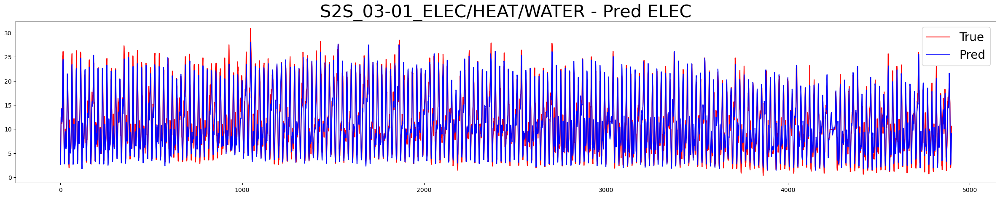

MAE  :  0.0
MAPE :  7706.7932
MSE  :  0.0
RMSE :  0.0
MBE :  -0.0
R2   :  0.8747


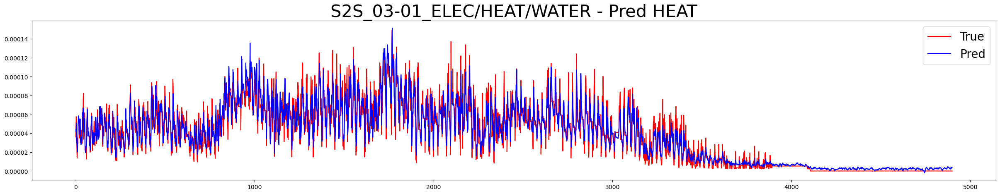

MAE  :  0.04
MAPE :  0.2543
MSE  :  0.0026
RMSE :  0.051
MBE :  -0.016
R2   :  0.7938


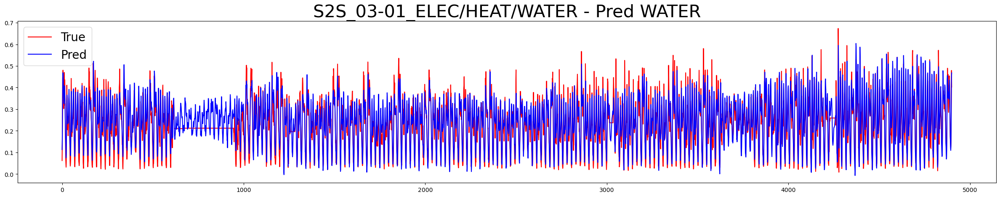

S2S_03-02_ELEC/HEAT/HOT
154/154 [==============================] - 1s 6ms/step
MAE  :  1.3333
MAPE :  0.1487
MSE  :  2.9939
RMSE :  1.7303
MBE :  0.3636
R2   :  0.9208


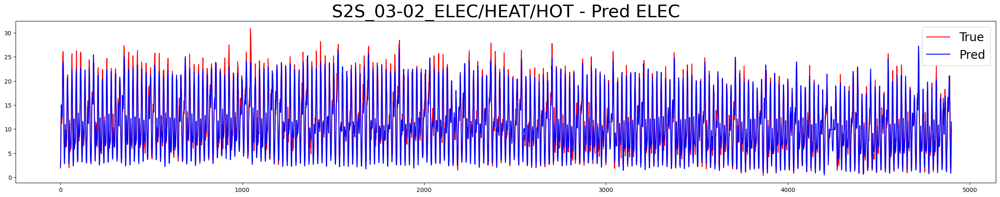

MAE  :  0.0
MAPE :  4213.0776
MSE  :  0.0
RMSE :  0.0
MBE :  -0.0
R2   :  0.8628


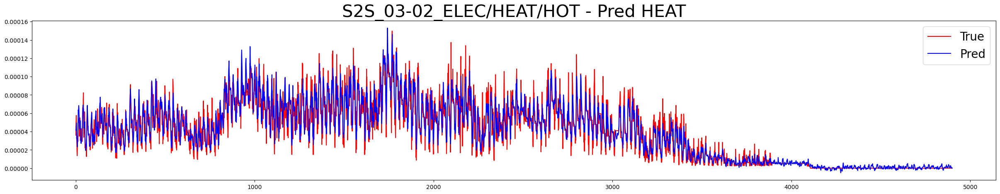

MAE  :  0.1539
MAPE :  1.1903
MSE  :  0.0577
RMSE :  0.2403
MBE :  0.0433
R2   :  0.6638


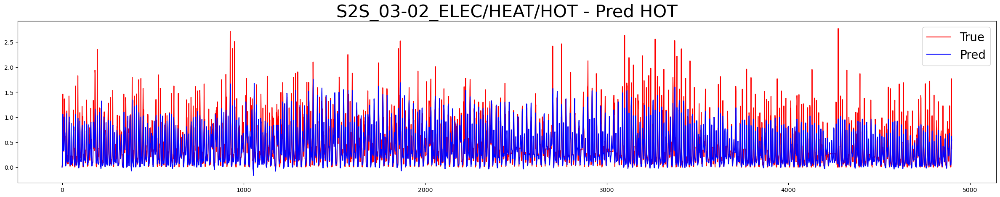

S2S_03-03_ELEC/HEAT/GAS
154/154 [==============================] - 1s 6ms/step
MAE  :  1.3436
MAPE :  0.1523
MSE  :  3.0873
RMSE :  1.7571
MBE :  0.3241
R2   :  0.9184


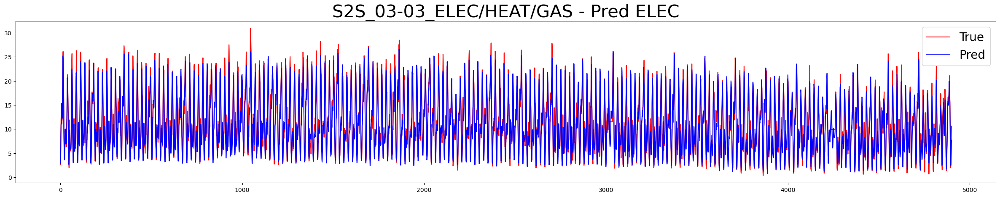

MAE  :  0.0
MAPE :  4745.4899
MSE  :  0.0
RMSE :  0.0
MBE :  0.0
R2   :  0.8543


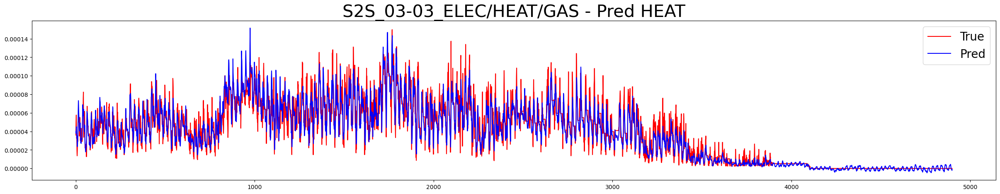

MAE  :  0.1434
MAPE :  9258324060035.334
MSE  :  0.0377
RMSE :  0.1941
MBE :  -0.0381
R2   :  0.4985


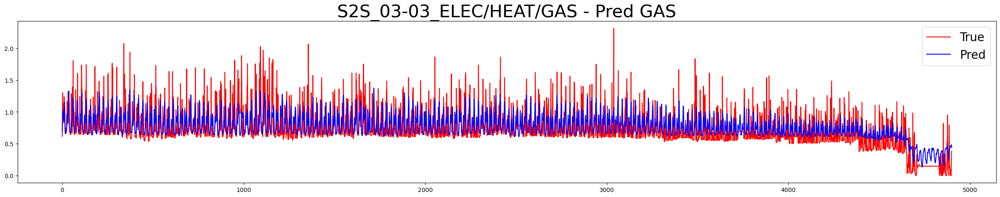

S2S_03-04_ELEC/WATER/HOT
154/154 [==============================] - 1s 6ms/step
MAE  :  1.2711
MAPE :  0.1404
MSE  :  2.7278
RMSE :  1.6516
MBE :  0.4744
R2   :  0.9279


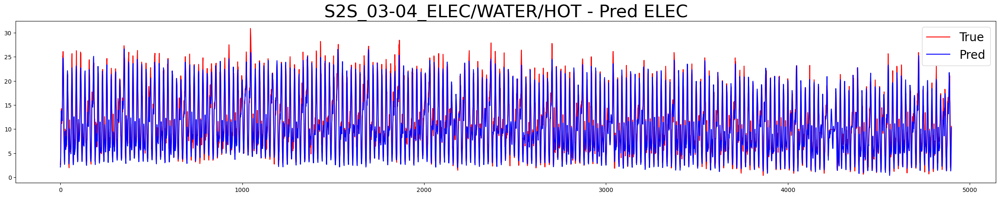

MAE  :  0.0
MAPE :  0.214
MSE  :  0.0
RMSE :  0.0
MBE :  0.0
R2   :  0.8118


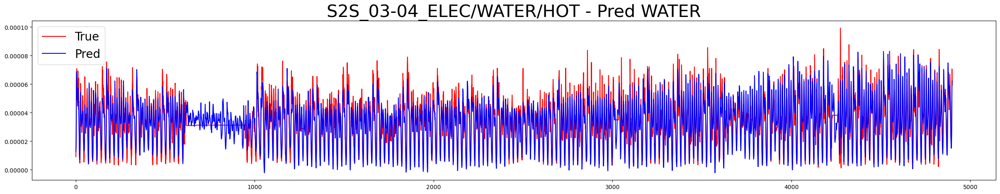

MAE  :  0.1451
MAPE :  1.587
MSE  :  0.0533
RMSE :  0.2309
MBE :  0.039
R2   :  0.6897


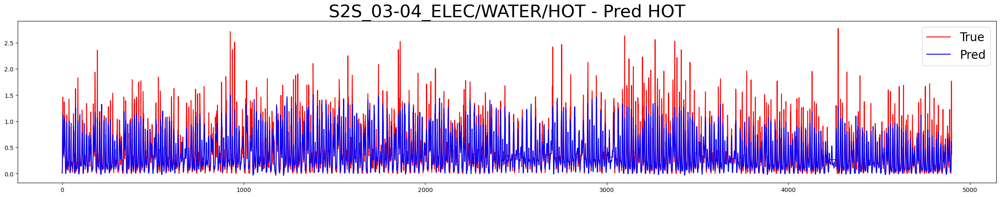

S2S_03-05_ELEC/WATER/GAS
154/154 [==============================] - 1s 6ms/step
MAE  :  1.3113
MAPE :  0.1463
MSE  :  2.9254
RMSE :  1.7104
MBE :  0.5405
R2   :  0.9226


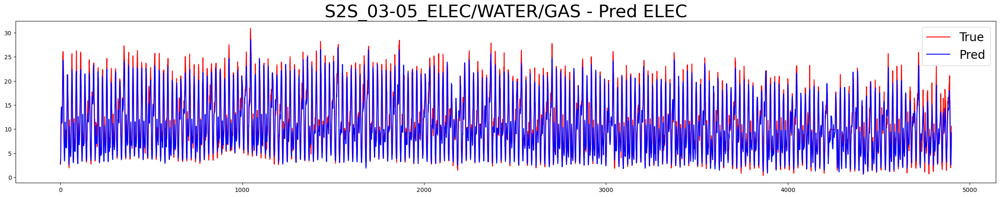

MAE  :  0.0
MAPE :  0.195
MSE  :  0.0
RMSE :  0.0
MBE :  -0.0
R2   :  0.8359


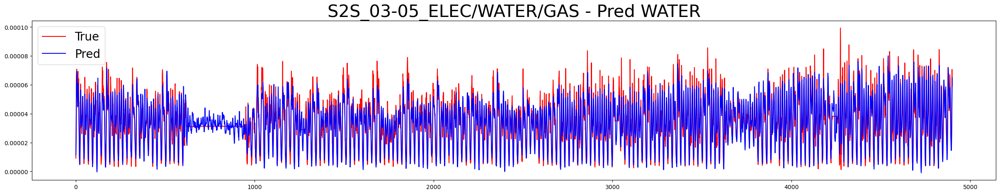

MAE  :  0.1445
MAPE :  9285053306006.844
MSE  :  0.0369
RMSE :  0.1921
MBE :  -0.0492
R2   :  0.5084


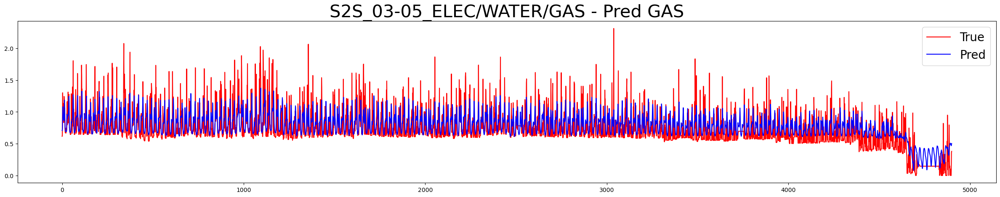

S2S_03-06_ELEC/HOT/GAS
154/154 [==============================] - 1s 6ms/step
MAE  :  1.3
MAPE :  0.1527
MSE  :  2.8499
RMSE :  1.6882
MBE :  -0.1494
R2   :  0.9246


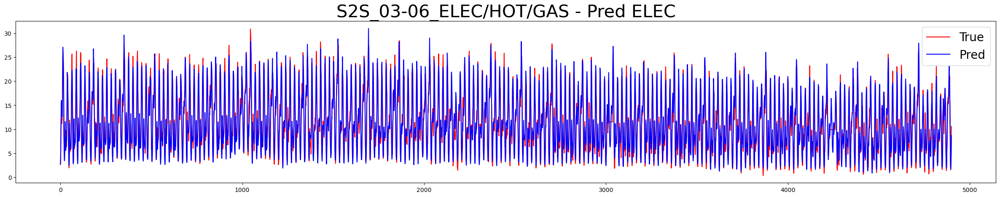

MAE  :  0.0
MAPE :  1.5268
MSE  :  0.0
RMSE :  0.0
MBE :  0.0
R2   :  0.5778


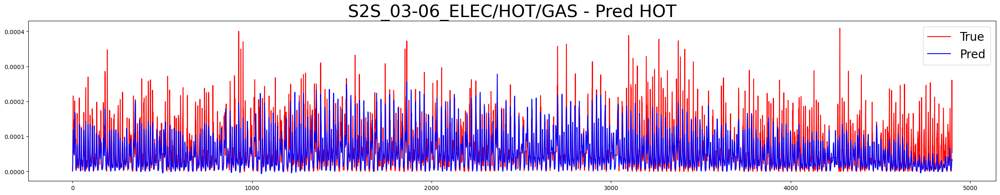

MAE  :  0.1471
MAPE :  10376089912762.799
MSE  :  0.04
RMSE :  0.1999
MBE :  -0.0453
R2   :  0.468


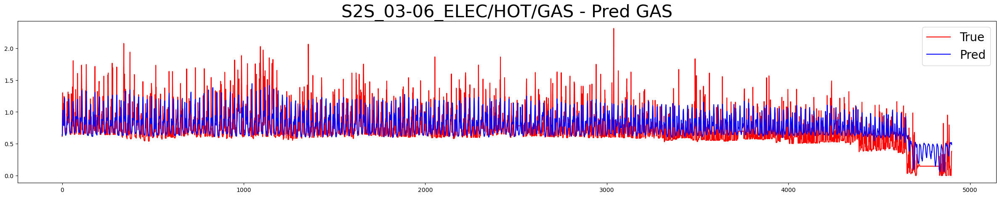

S2S_03-07_HEAT/WATER/HOT
154/154 [==============================] - 1s 6ms/step
MAE  :  1.383
MAPE :  0.4319
MSE  :  3.7481
RMSE :  1.936
MBE :  -0.4507
R2   :  0.8503


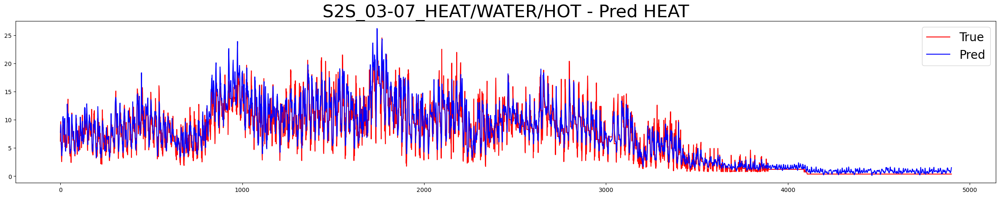

MAE  :  0.0
MAPE :  0.2229
MSE  :  0.0
RMSE :  0.0
MBE :  -0.0
R2   :  0.8076


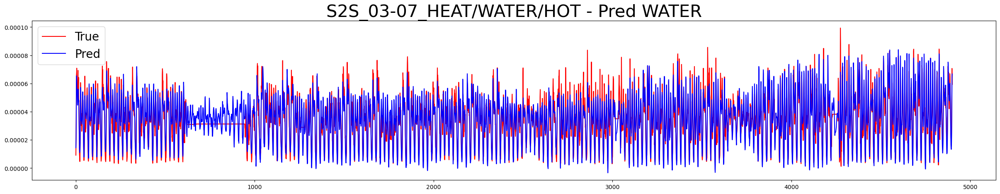

MAE  :  0.1541
MAPE :  0.9982
MSE  :  0.0631
RMSE :  0.2513
MBE :  0.0931
R2   :  0.6325


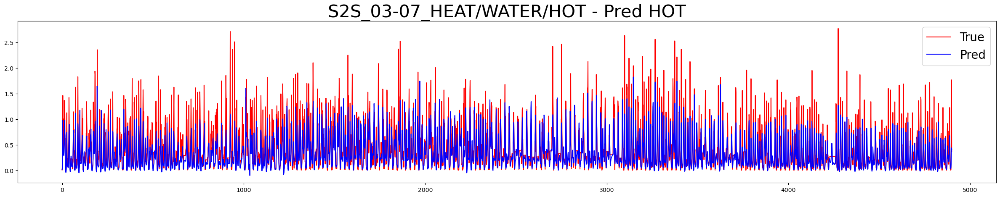

S2S_03-08_HEAT/WATER/GAS
154/154 [==============================] - 1s 6ms/step
MAE  :  1.3081
MAPE :  0.312
MSE  :  3.5018
RMSE :  1.8713
MBE :  -0.1984
R2   :  0.8602


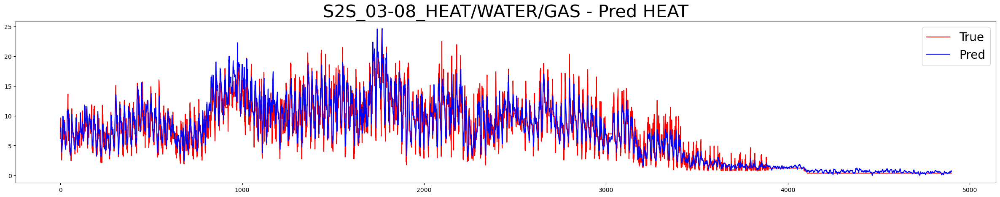

MAE  :  0.0
MAPE :  0.2424
MSE  :  0.0
RMSE :  0.0
MBE :  0.0
R2   :  0.7762


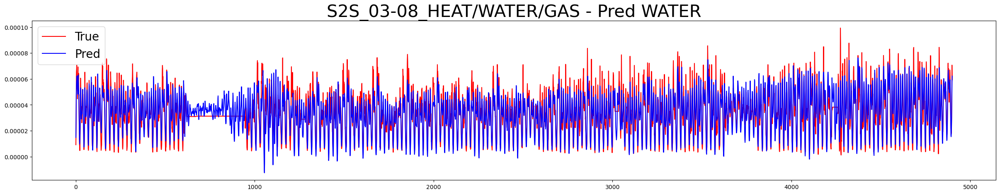

MAE  :  0.1502
MAPE :  10812446114054.08
MSE  :  0.0401
RMSE :  0.2001
MBE :  -0.0511
R2   :  0.4666


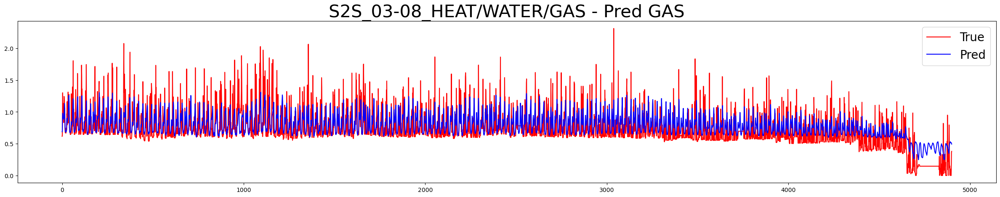

S2S_03-09_HEAT/WATER/GAS
154/154 [==============================] - 1s 6ms/step
MAE  :  1.2518
MAPE :  0.332
MSE  :  3.2888
RMSE :  1.8135
MBE :  0.0133
R2   :  0.8687


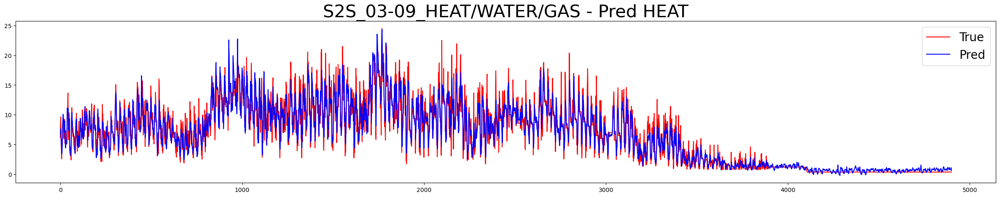

MAE  :  0.0
MAPE :  1.5308
MSE  :  0.0
RMSE :  0.0
MBE :  0.0
R2   :  0.6221


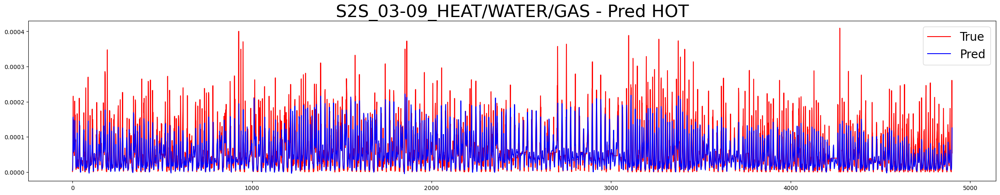

MAE  :  0.1607
MAPE :  11971886913452.367
MSE  :  0.045
RMSE :  0.2122
MBE :  -0.0693
R2   :  0.4005


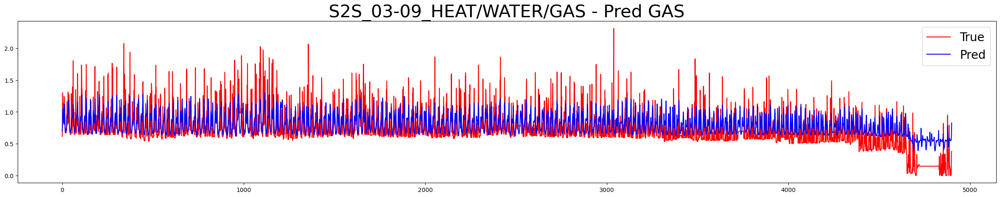

S2S_03-10_WATER/HOT/GAS
154/154 [==============================] - 1s 6ms/step
MAE  :  0.9332
MAPE :  0.2048
MSE  :  1.4497
RMSE :  1.204
MBE :  -0.1015
R2   :  0.7971


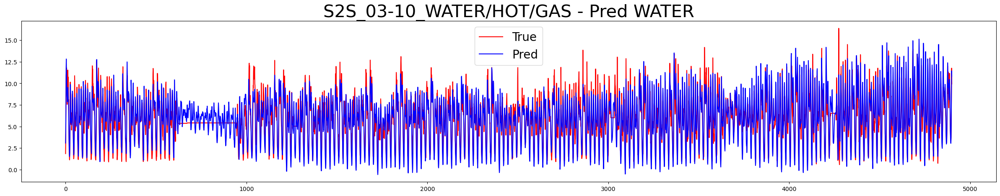

MAE  :  0.0
MAPE :  1.2693
MSE  :  0.0
RMSE :  0.0
MBE :  0.0
R2   :  0.6921


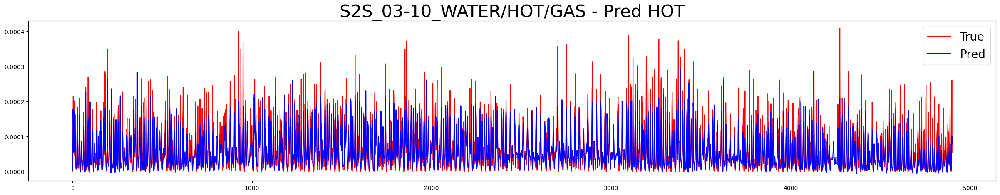

MAE  :  0.1674
MAPE :  11992684635311.273
MSE  :  0.0483
RMSE :  0.2197
MBE :  -0.0745
R2   :  0.3571


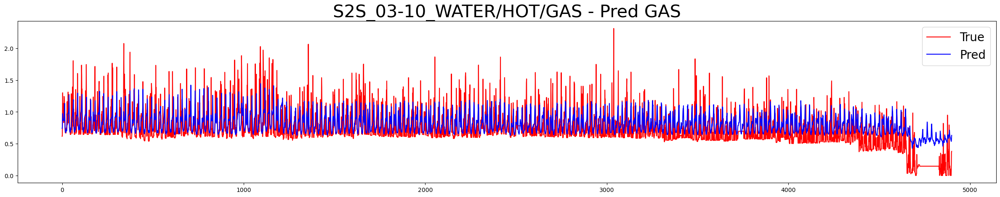

In [19]:
model_3multi_evaluation(model_3multi_0301, back_data, test0301x, test0301y, "S2S_03-01_ELEC/HEAT/WATER", ["ELEC", "HEAT", "WATER"])
model_3multi_evaluation(model_3multi_0302, back_data, test0302x, test0302y, "S2S_03-02_ELEC/HEAT/HOT", ["ELEC", "HEAT", "HOT"])
model_3multi_evaluation(model_3multi_0303, back_data, test0303x, test0303y, "S2S_03-03_ELEC/HEAT/GAS", ["ELEC", "HEAT", "GAS"])
model_3multi_evaluation(model_3multi_0304, back_data, test0304x, test0304y, "S2S_03-04_ELEC/WATER/HOT", ["ELEC", "WATER", "HOT"])
model_3multi_evaluation(model_3multi_0305, back_data, test0305x, test0305y, "S2S_03-05_ELEC/WATER/GAS", ["ELEC", "WATER", "GAS"])
model_3multi_evaluation(model_3multi_0306, back_data, test0306x, test0306y, "S2S_03-06_ELEC/HOT/GAS", ["ELEC", "HOT", "GAS"])
model_3multi_evaluation(model_3multi_0307, back_data, test0307x, test0307y, "S2S_03-07_HEAT/WATER/HOT", ["HEAT", "WATER", "HOT"])
model_3multi_evaluation(model_3multi_0308, back_data, test0308x, test0308y, "S2S_03-08_HEAT/WATER/GAS", ["HEAT", "WATER", "GAS"])
model_3multi_evaluation(model_3multi_0309, back_data, test0309x, test0309y, "S2S_03-09_HEAT/WATER/GAS", ["HEAT", "HOT", "GAS"])
model_3multi_evaluation(model_3multi_0310, back_data, test0310x, test0310y, "S2S_03-10_WATER/HOT/GAS", ["WATER", "HOT", "GAS"])